In [7]:
import cv2
import numpy as np

from IPython.display import display, Image

from matplotlib import pyplot as plt
from matplotlib import image as mplImage

/tmp/ipykernel_46838/1400835323.py:10: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)
/tmp/ipykernel_46838/1400835323.py:22: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


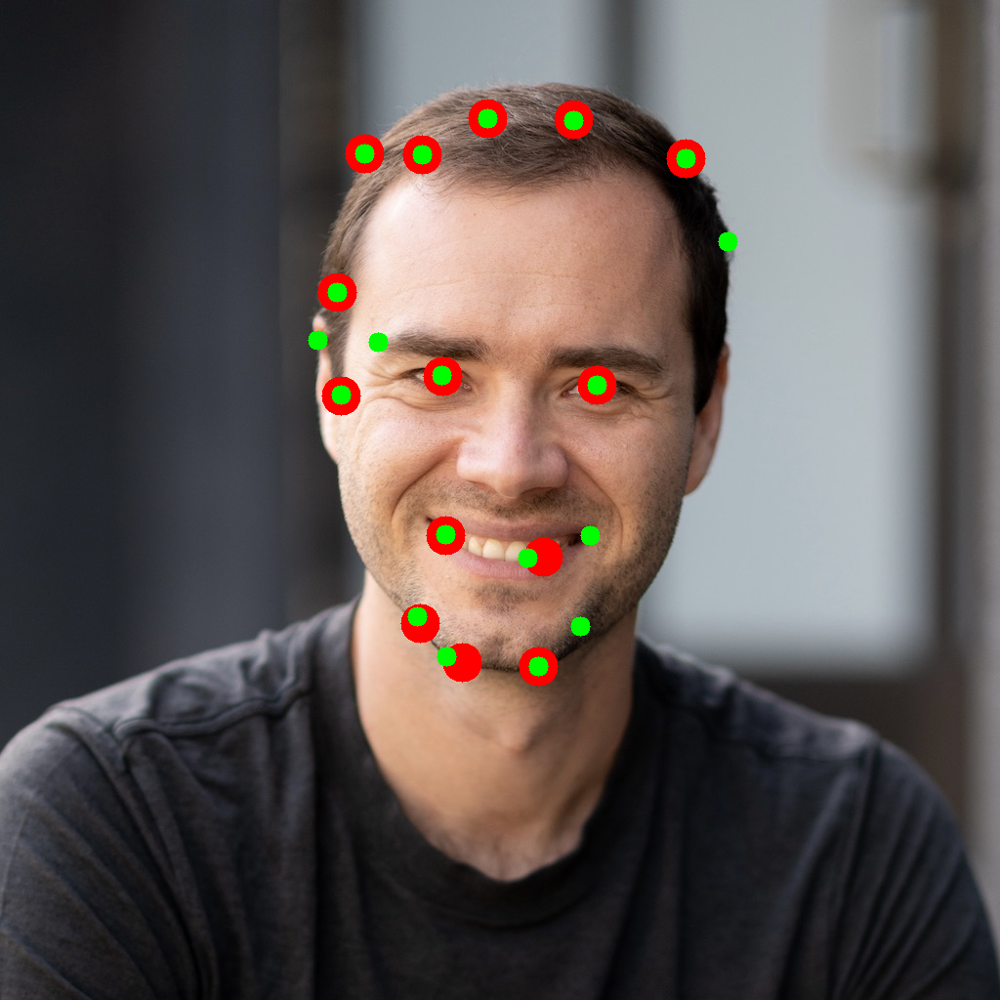

In [14]:
# origial author: https://github.com/samwestby/OpenCV-Python-Tutorial/blob/main/5_corner_detection.py

img = cv2.imread('inputs/Karpathy.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


# SHI-TOMASI METHOD
corners = cv2.goodFeaturesToTrack(gray_img, maxCorners=50,
                qualityLevel=0.15, minDistance=50)
corners = np.int0(corners)

for c in corners:
    x, y = c.ravel()
    img = cv2.circle(img, center=(x, y), radius=20, 
                    color=(0, 0, 255), thickness=-1)
#end-for

# HARRIS CORNER DETECTION
corners = cv2.goodFeaturesToTrack(gray_img, maxCorners=50,
                qualityLevel=0.01, minDistance=50,
                useHarrisDetector=True, k=0.1)
corners = np.int0(corners)

for c in corners:
    x, y = c.ravel()
    img = cv2.circle(img, center=(x, y), radius=10, 
                    color=(0, 254, 0), thickness=-1)
#end-for

# cv2.imshow("Shape", img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

output_path = 'outputs/harris_corners.png'

cv2.imwrite(output_path, img)

display(Image(filename=output_path))

In [3]:
# # Function to apply Harris Corner Detector
# def harris_corner_detector(image):
#     gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     gray = np.float32(gray)
    
#     # Harris Corner Detector parameters
#     block_size = 2
#     ksize = 3
#     k = 0.04
    
#     # Apply Harris Corner Detector
#     corners = cv2.cornerHarris(gray, block_size, ksize, k)
    
#     # Thresholding
#     corners = cv2.threshold(corners, 0.01 * corners.max(), 255, 0)[1]
    
#     # Find keypoints
#     keypoints = np.argwhere(corners > 0.01 * corners.max())
#     keypoints = [cv2.KeyPoint(x[1], x[0], 1) for x in keypoints]
    
#     return keypoints

# # Apply Harris Corner Detector on both images
# image1 = cv2.imread('inputs/Karpathy.jpg')
# keypoints_harris1 = harris_corner_detector(image1)
# # keypoints_harris2 = harris_corner_detector(image2)

# # Draw Harris corners on the images
# img_harris1 = cv2.drawKeypoints(image1, keypoints_harris1, None, color=(255, 0, 0), flags=0)
# # img_harris2 = cv2.drawKeypoints(image2, keypoints_harris2, None, color=(255, 0, 0), flags=0)

# # Display the images with Harris corners
# cv2.imshow("Harris Corners - Image 1", img_harris1)
# # cv2.imshow("Harris Corners - Image 2", img_harris2)
# # cv2.waitKey(0)
# cv2.destroyAllWindows()

### Part-1:

In [21]:
def siftAlgorithm(image_1_path, image_2_path):
    '''
    args:
        image1_path (string):
        image2_path (string):
    return:
        None
    '''
    # Load stereo images
    image_1 = cv2.imread(image_1_path, cv2.IMREAD_GRAYSCALE)
    image_2 = cv2.imread(image_2_path, cv2.IMREAD_GRAYSCALE)

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors
    key_points_1, descriptors_1 = sift.detectAndCompute(image_1, None)
    key_points_2, descriptors_2 = sift.detectAndCompute(image_2, None)
    
    
    # It is a BFMatcher with NORM_L2 which measures Euclidean distance:
    brute_force_matcher = cv2.BFMatcher()
    # bf = cv2.BFMatcher()

    # Match descriptors using NCC and L2 distance metrics
    matches_NCC = brute_force_matcher.match(descriptors_1, descriptors_2)
    matches_L2  = brute_force_matcher.knnMatch(descriptors_1, descriptors_2, k=2)

    # Apply ratio test to filter good matches using L2 distance    
    good_matches_l2 = [m for m, n in matches_L2 if m.distance < 0.95 * n.distance]


    # Draw matches using NCC
    img_matches_ncc = cv2.drawMatches(image_1, key_points_1, image_2, key_points_2, matches_NCC, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Draw matches using L2 distance
    img_matches_l2 = cv2.drawMatches(image_1, key_points_1, image_2, key_points_2, good_matches_l2, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    cv2.imwrite('outputs/sift_matches_NCC.png', img_matches_ncc)
    cv2.imwrite('outputs/sift_matches_L2.png', img_matches_l2)
    
    display(Image(filename='outputs/sift_matches_NCC.png'))
    display(Image(filename='outputs/sift_matches_L2.png'))
#end-def

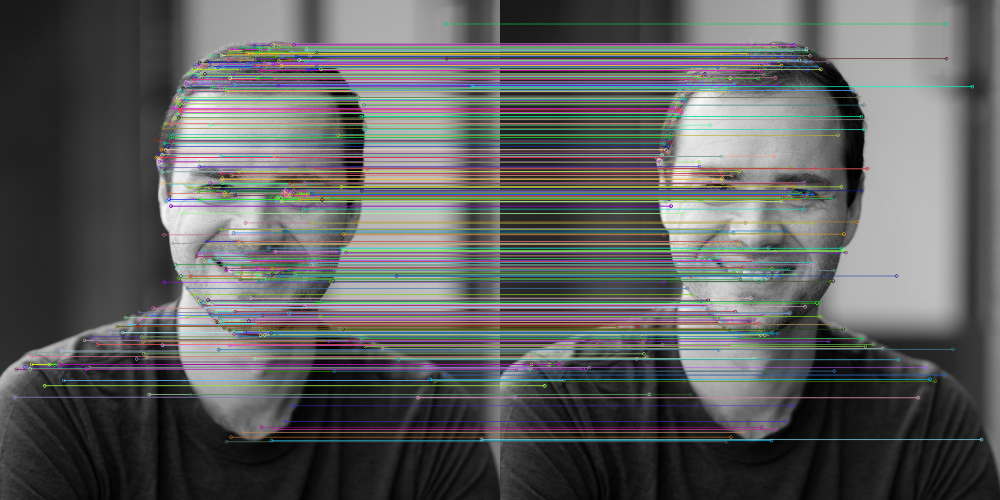

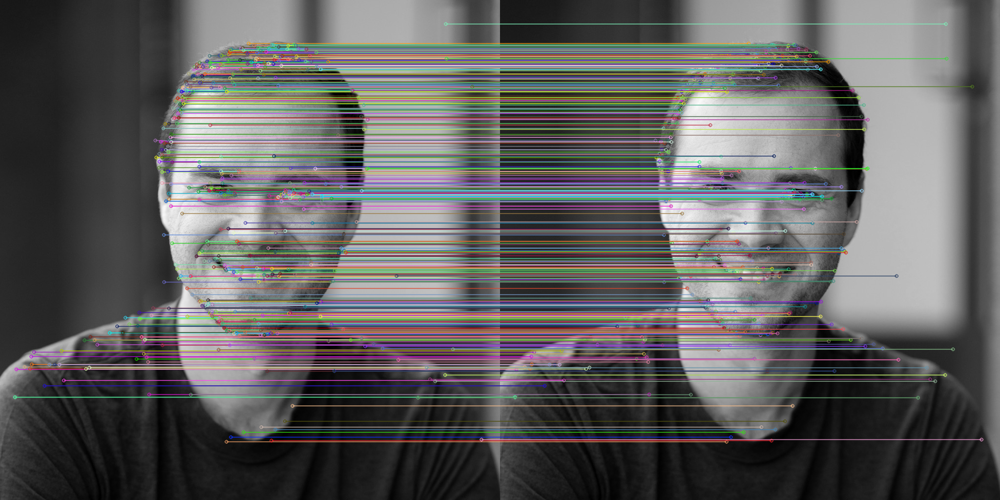

In [22]:
image_1_path = 'inputs/Karpathy.jpg'
image_2_path = 'inputs/Karpathy.jpg'

siftAlgorithm(image_1_path, image_2_path)

### Part-2:

In [25]:
def detect_and_match_corners_sift(img1_path, img2_path, harris_k=1.0/10.0):
    '''
    args:
        image1_path (string):
        image2_path (string):
    return:
        None
    '''
    # Load two images
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    # Convert images to grayscale
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    # Detect corners using the Harris Corner Detector
    corners_response1 = cv2.cornerHarris(gray1, blockSize=2, ksize=5, k=harris_k)
    corners_response2 = cv2.cornerHarris(gray2, blockSize=2, ksize=5, k=harris_k)

    # Convert Harris corners to keypoints
    kp1 = np.argwhere(corners_response1 > 0.01 * corners_response1.max())
    kp1 = [cv2.KeyPoint(float(x[1]), float(x[0]), 20) for x in kp1]

    kp2 = np.argwhere(corners_response2 > 0.01 * corners_response2.max())
    kp2 = [cv2.KeyPoint(float(x[1]), float(x[0]), 20) for x in kp2]

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Compute descriptors
    ignore, des1 = sift.compute(img1, kp1)
    ignore, des2 = sift.compute(img2, kp2)

    # Initialize BFMatcher with NORM_L2 (Euclidean distance)
    bf = cv2.BFMatcher()

    # Match descriptors using NCC and L2 distance metrics
    matches_ncc = bf.match(des1, des2)
    matches_l2 = bf.knnMatch(des1, des2, k=2)

    # Apply ratio test to filter good matches using L2 distance
    good_matches_l2 = [m for m, n in matches_l2 if m.distance < 0.75 * n.distance]

    # Draw matches using NCC
    img_matches_ncc = cv2.drawMatches(img1, kp1, img2, kp2, matches_ncc, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Draw matches using L2 distance
    img_matches_l2 = cv2.drawMatches(img1, kp1, img2, kp2, good_matches_l2, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    cv2.imwrite('outputs/harris_Matches_NCC.png', img_matches_ncc)
    cv2.imwrite('outputs/harris_Matches_L2.png', img_matches_l2)
    
    display(Image(filename='outputs/harris_Matches_NCC.png'))
    display(Image(filename='outputs/harris_Matches_L2.png'))

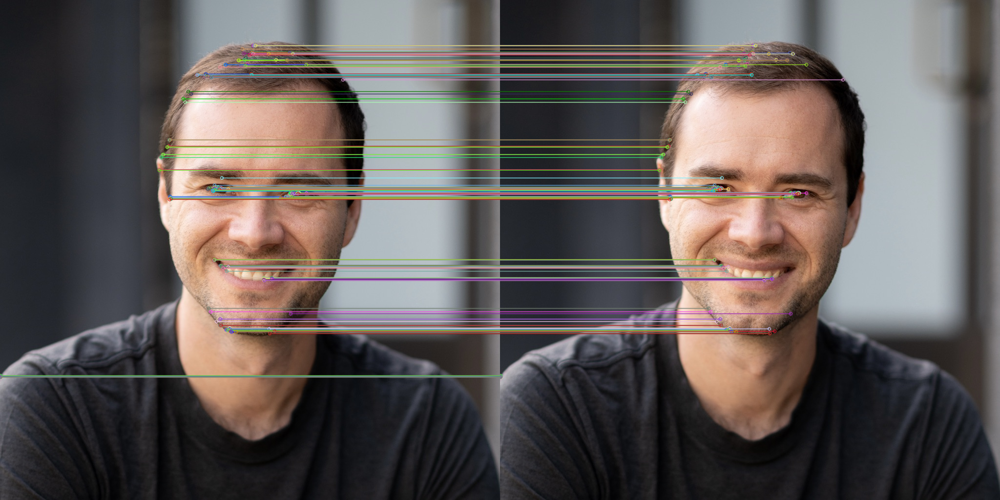

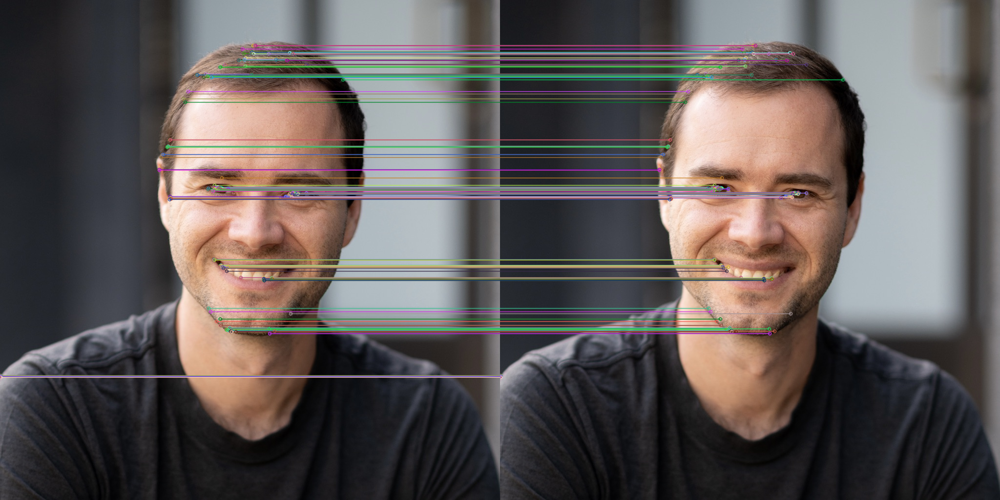

In [26]:
image1 = 'inputs/Karpathy.jpg'
detect_and_match_corners_sift(image1, image1)

### Part-3:

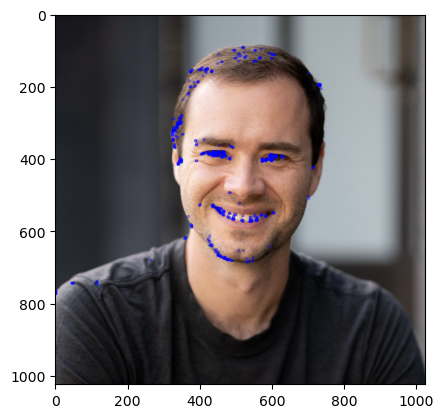

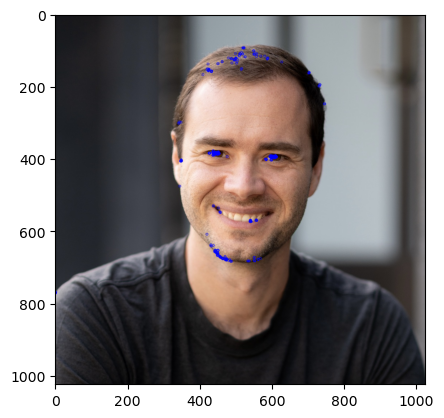

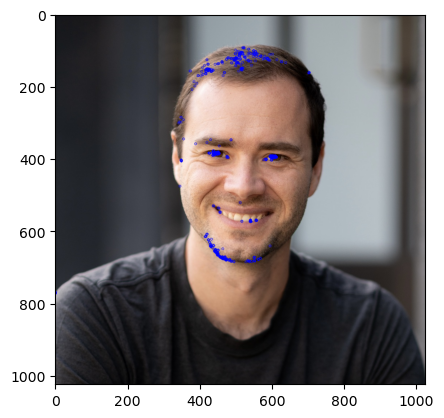

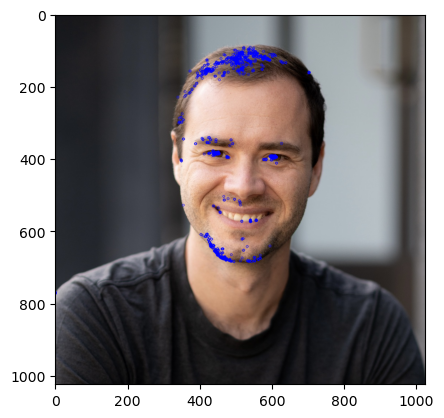

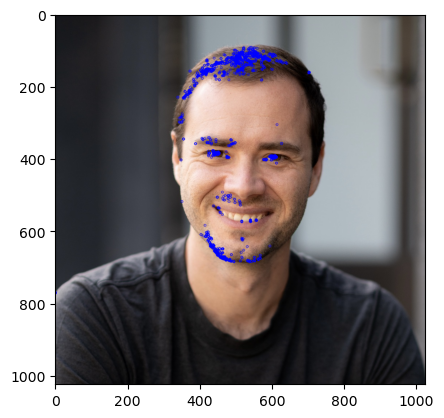

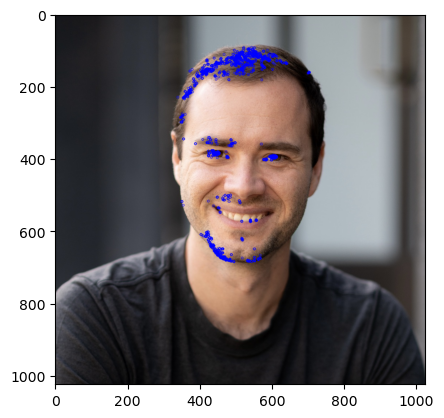

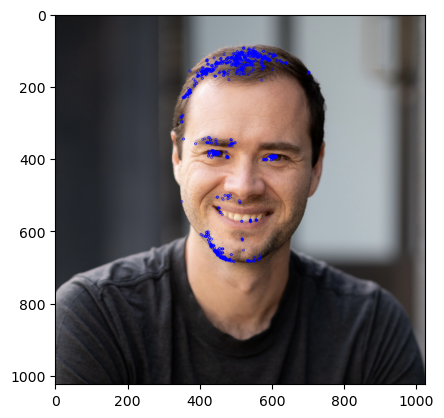

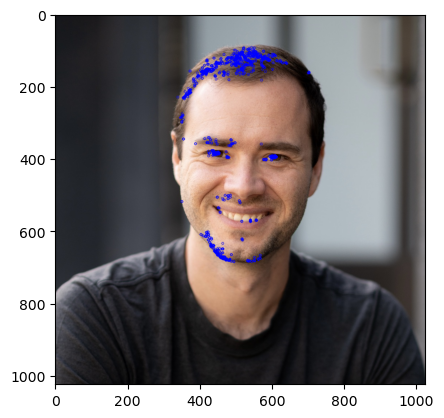

In [20]:
# Function to apply Scale Harris Corner Detector
def scale_harris_detector(image, min_scale, max_scale, scale_step):
    keypoints_all_scales = []

    for scale in np.arange(min_scale, max_scale + scale_step, scale_step):
        # Resize image
        resized_image = cv2.resize(image, (0, 0), fx=scale, fy=scale)

        # Convert to grayscale
        gray = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)

        # Apply Harris Corner Detector
        corners = cv2.cornerHarris(gray, 2, 3, 0.04)

        # Thresholding
        corners = cv2.threshold(corners, 0.01 * corners.max(), 255, 0)[1]

        # Find keypoints
        keypoints = np.argwhere(corners > 0.01 * corners.max())
        keypoints = [cv2.KeyPoint(x[1] / scale, x[0] / scale, 1) for x in keypoints]

        # Store keypoints for visualization
        keypoints_all_scales.append(keypoints)

    return keypoints_all_scales

# Load an image
image_1_path = 'inputs/Karpathy.jpg'
image = cv2.imread(image_1_path)

# Set parameters for scale variation
min_scale = 0.5
max_scale = 4.0
scale_step = 0.5

# Apply Scale Harris Corner Detector
keypoints_all_scales = scale_harris_detector(image, min_scale, max_scale, scale_step)


C = 0
# Draw keypoints on the original image for each scale
for i, keypoints_scale in enumerate(keypoints_all_scales):
    img_with_keypoints = cv2.drawKeypoints(image, keypoints_scale, None, color=(255, 0, 0), flags=0)
    
    cv2.imwrite(f'outputs/Scale_Harris_{i+1}.png', img_with_keypoints)
    C += 1
    # display(Image(filename=f'Scale Harris: Scale {i+1}.png'))
    # cv2.imshow(f"Scale Harris - Scale {i + 1}", img_with_keypoints)
    # cv2.waitKey(0)
#end-for
# cv2.destroyAllWindows()

for i in range(C):
    image = mplImage.imread(f'outputs/Scale_Harris_{i+1}.png')
    plt.title = 'Scale at {i+1}'
    plt.imshow(image)
    plt.show()
#end-for